In [5]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.arima_model import ARIMA
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.stats.diagnostic import acorr_ljungbox
import scipy.stats as scs
from Arimautility import test_autocorrelation

In [6]:
import seaborn as sns 

plt.set_cmap('cubehelix')
sns.set_palette('cubehelix')

COLORS = [plt.cm.cubehelix(x) for x in [0.1, 0.3, 0.5, 0.7]]

<Figure size 576x396 with 0 Axes>

In [7]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [8]:
import matplotlib.pyplot as plt
import warnings

plt.style.use('seaborn')

plt.rcParams['figure.figsize'] = [8, 4.5]
plt.rcParams['figure.dpi'] = 300
warnings.simplefilter(action='ignore', category=FutureWarning)

In [9]:
df = yf.download('035720.KS',
                 start='2018-01-01',
                 end='2021-03-31',
                 adjusted=True,
                 progress=False)

goog = df.resample('W') \
         .last() \
         .rename(columns={'Adj Close': 'adj_close'}) \
         .adj_close 

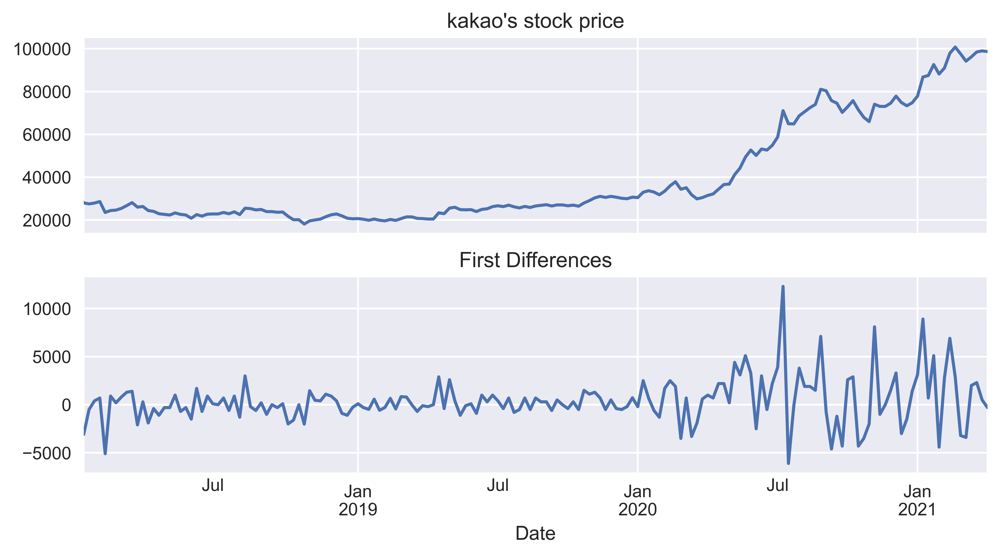

In [10]:
goog_diff = goog.diff().dropna()

fig, ax = plt.subplots(2, sharex=True)
goog.plot(title = "kakao's stock price", ax=ax[0])
goog_diff.plot(ax=ax[1], title='First Differences')

plt.tight_layout()

plt.show()

ADF test statistic: -2.20 (p-val: 0.21)
KPSS test statistic: 0.62 (p-val: 0.02)


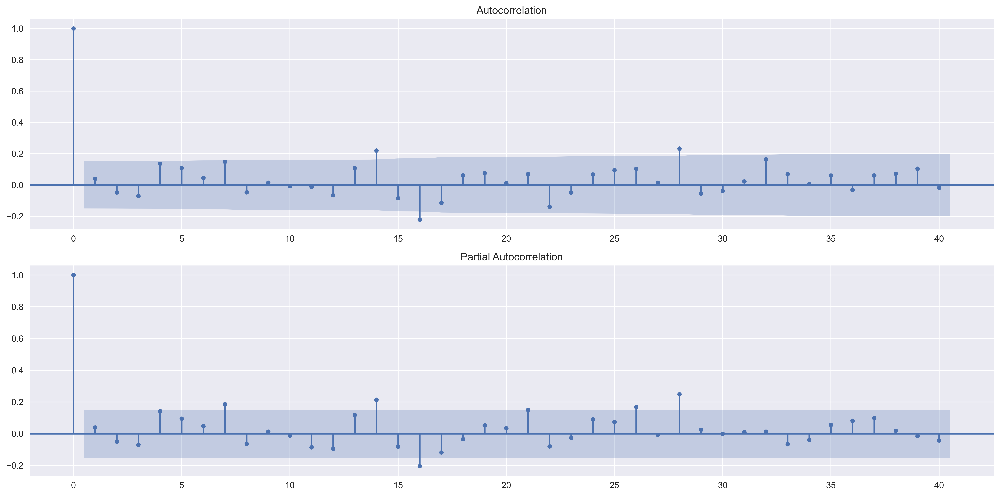

In [11]:
fig = test_autocorrelation(goog_diff)

plt.tight_layout()

plt.show()

In [12]:
arima = ARIMA(goog, order=(2, 1, 1)).fit(disp=0)
arima.summary()

/Users/tk/miniforge3/envs/project/lib/python3.8/site-packages/statsmodels/tsa/arima_model.py:1396: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(np.r_[1, self.maparams])**-1


<class 'statsmodels.iolib.summary.Summary'>
"""
                             ARIMA Model Results                              
==============================================================================
Dep. Variable:            D.adj_close   No. Observations:                  169
Model:                 ARIMA(2, 1, 1)   Log Likelihood               -1551.496
Method:                       css-mle   S.D. of innovations           2348.390
Date:                Mon, 26 Apr 2021   AIC                           3112.991
Time:                        12:21:09   BIC                           3128.641
Sample:                    01-14-2018   HQIC                          3119.342
                         - 04-04-2021                                         
=====================================================================================
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
const               400.7133    176.270      2.273      0.024      55.231     746.196
ar.L1.D.adj_close     0.2140      0.484      0.443      0.659      -0.734       1.162
ar.L2.D.adj_close    -0.0618      0.078     -0.790      0.431      -0.215       0.091
ma.L1.D.adj_close    -0.1734      0.479     -0.362      0.718      -1.113       0.766
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1            1.7329           -3.6320j            4.0242           -0.1791
AR.2            1.7329           +3.6320j            4.0242            0.1791
MA.1            5.7664           +0.0000j            5.7664            0.0000
-----------------------------------------------------------------------------
"""

In [13]:
def arima_diagnostics(resids, n_lags=40):
   
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2)

    r = resids
    resids = (r - np.nanmean(r)) / np.nanstd(r)
    resids_nonmissing = resids[~(np.isnan(resids))]
    
   
    sns.lineplot(x=np.arange(len(resids)), y=resids, ax=ax1)
    ax1.set_title('Standardized residuals')

 
    x_lim = (-1.96 * 2, 1.96 * 2)
    r_range = np.linspace(x_lim[0], x_lim[1])
    norm_pdf = scs.norm.pdf(r_range)
    
    sns.distplot(resids_nonmissing, hist=True, kde=True, 
                 norm_hist=True, ax=ax2)
    ax2.plot(r_range, norm_pdf, 'g', lw=2, label='N(0,1)')
    ax2.set_title('Distribution of standardized residuals')
    ax2.set_xlim(x_lim)
    ax2.legend()
        
    # Q-Q plot
    qq = sm.qqplot(resids_nonmissing, line='s', ax=ax3)
    ax3.set_title('Q-Q plot')

    # ACF plot
    plot_acf(resids, ax=ax4, lags=n_lags, alpha=0.05)
    ax4.set_title('ACF plot')

    return fig

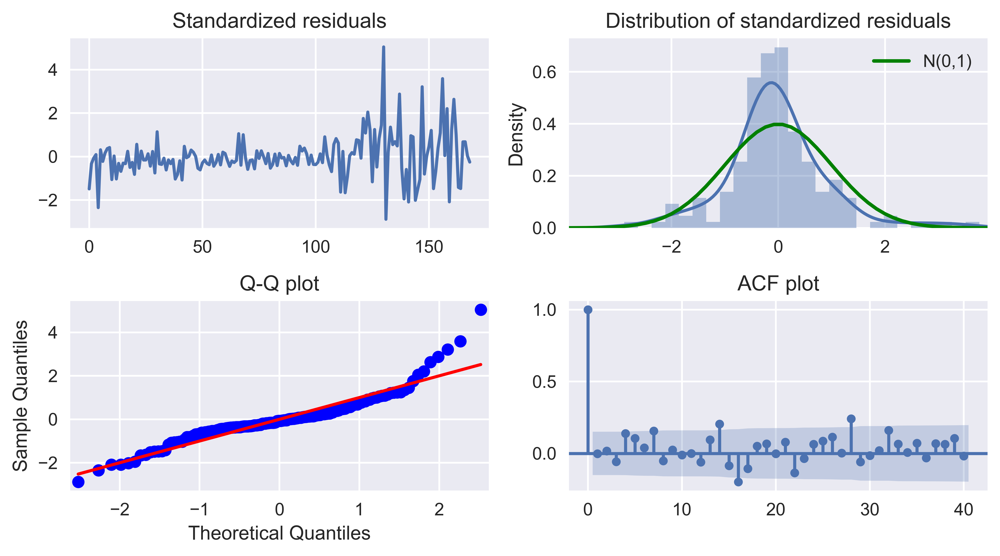

In [14]:
arima_diagnostics(arima.resid, 40)

plt.tight_layout()

plt.show()

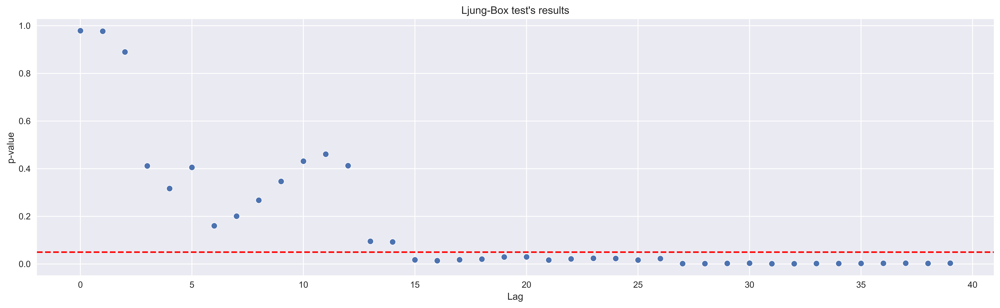

In [15]:
ljung_box_results = acorr_ljungbox(arima.resid)

fig, ax = plt.subplots(1, figsize=[16, 5])
sns.scatterplot(x=range(len(ljung_box_results[1])), 
                y=ljung_box_results[1], 
                ax=ax)
ax.axhline(0.05, ls='--', c='r')
ax.set(title="Ljung-Box test's results",
       xlabel='Lag',
       ylabel='p-value')

plt.tight_layout()

plt.show()

In [16]:
pip install pmdarima

distutils: /Users/tk/miniforge3/envs/project/include/python3.8/UNKNOWN
sysconfig: /Users/tk/miniforge3/envs/project/include/python3.8
user = False
home = None
root = None
prefix = None
     |████████████████████████████████| 1.0 MB 720 kB/s eta 0:00:01
     |████████████████████████████████| 7.3 MB 4.5 MB/s eta 0:00:01
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Using cached statsmodels-0.12.2.tar.gz (17.5 MB)
  Installing build dependencies ... error
  ERROR: Command errored out with exit status 1:
   command: /Users/tk/miniforge3/envs/project/bin/python /private/var/folders/k5/gr4bkrmj6p718znlvt_3mx2c0000gn/T/pip-standalone-pip-emrnkcr0/__env_pip__.zip/pip install --ignore-installed --no-user --prefix /private/var/folders/k5/gr4bkrmj6p718znlvt_3mx2c0000gn/T/pip-build-env-0_b0vjm2/overlay --no-warn-script-location --no-binary :none: --only-binary :none: -i https://pypi.org/simple -- setuptools wheel 'c

      compile options: '-Inumpy/core/src/common -Inumpy/core/src -Inumpy/core -Inumpy/core/src/npymath -Inumpy/core/src/multiarray -Inumpy/core/src/umath -Inumpy/core/src/npysort -I/Users/tk/miniforge3/envs/project/include/python3.8 -c'
      gcc: _configtest.c
      gcc -arch arm64 _configtest.o -o _configtest
      success!
      removing: _configtest.c _configtest.o _configtest.o.d _configtest
      C compiler: gcc -Wno-unused-result -Wsign-compare -Wunreachable-code -DNDEBUG -g -fwrapv -O3 -Wall -Wstrict-prototypes -I/Users/tk/miniforge3/envs/project/include -arch arm64 -I/Users/tk/miniforge3/envs/project/include -arch arm64
  
      compile options: '-Inumpy/core/src/common -Inumpy/core/src -Inumpy/core -Inumpy/core/src/npymath -Inumpy/core/src/multiarray -Inumpy/core/src/umath -Inumpy/core/src/npysort -I/Users/tk/miniforge3/envs/project/include/python3.8 -c'
      gcc: _configtest.c
      _configtest.c:5:3: warning: ignoring return value of function declared with const attribute 

      _configtest.c:11:5: warning: incompatible redeclaration of library function 'truncf' [-Wincompatible-library-redeclaration]
      int truncf (void);
          ^
      _configtest.c:11:5: note: 'truncf' is a builtin with type 'float (float)'
      _configtest.c:12:5: warning: incompatible redeclaration of library function 'sqrtf' [-Wincompatible-library-redeclaration]
      int sqrtf (void);
          ^
      _configtest.c:12:5: note: 'sqrtf' is a builtin with type 'float (float)'
      _configtest.c:13:5: warning: incompatible redeclaration of library function 'log10f' [-Wincompatible-library-redeclaration]
      int log10f (void);
          ^
      _configtest.c:13:5: note: 'log10f' is a builtin with type 'float (float)'
      _configtest.c:14:5: warning: incompatible redeclaration of library function 'logf' [-Wincompatible-library-redeclaration]
      int logf (void);
          ^
      _configtest.c:14:5: note: 'logf' is a builtin with type 'float (float)'
      _configtest.c:1

      creating build/lib.macosx-11.0-arm64-3.8/numpy/polynomial
      copying numpy/polynomial/laguerre.py -> build/lib.macosx-11.0-arm64-3.8/numpy/polynomial
      copying numpy/polynomial/_polybase.py -> build/lib.macosx-11.0-arm64-3.8/numpy/polynomial
      copying numpy/polynomial/polyutils.py -> build/lib.macosx-11.0-arm64-3.8/numpy/polynomial
      copying numpy/polynomial/__init__.py -> build/lib.macosx-11.0-arm64-3.8/numpy/polynomial
      copying numpy/polynomial/setup.py -> build/lib.macosx-11.0-arm64-3.8/numpy/polynomial
      copying numpy/polynomial/hermite_e.py -> build/lib.macosx-11.0-arm64-3.8/numpy/polynomial
      copying numpy/polynomial/chebyshev.py -> build/lib.macosx-11.0-arm64-3.8/numpy/polynomial
      copying numpy/polynomial/polynomial.py -> build/lib.macosx-11.0-arm64-3.8/numpy/polynomial
      copying numpy/polynomial/legendre.py -> build/lib.macosx-11.0-arm64-3.8/numpy/polynomial
      copying numpy/polynomial/hermite.py -> build/lib.macosx-11.0-arm64-3.8/n

      compile options: '-Inumpy/core/src/common -Inumpy/core/src -Inumpy/core -Inumpy/core/src/npymath -Inumpy/core/src/multiarray -Inumpy/core/src/umath -Inumpy/core/src/npysort -I/Users/tk/miniforge3/envs/project/include/python3.8 -c'
      gcc: _configtest.c
      removing: _configtest.c _configtest.o _configtest.o.d
      C compiler: gcc -Wno-unused-result -Wsign-compare -Wunreachable-code -DNDEBUG -g -fwrapv -O3 -Wall -Wstrict-prototypes -I/Users/tk/miniforge3/envs/project/include -arch arm64 -I/Users/tk/miniforge3/envs/project/include -arch arm64
  
      compile options: '-Inumpy/core/src/common -Inumpy/core/src -Inumpy/core -Inumpy/core/src/npymath -Inumpy/core/src/multiarray -Inumpy/core/src/umath -Inumpy/core/src/npysort -I/Users/tk/miniforge3/envs/project/include/python3.8 -c'
      gcc: _configtest.c
      removing: _configtest.c _configtest.o _configtest.o.d
      C compiler: gcc -Wno-unused-result -Wsign-compare -Wunreachable-code -DNDEBUG -g -fwrapv -O3 -Wall -Wstrict-pr

      compile options: '-Inumpy/core/src/common -Inumpy/core/src -Inumpy/core -Inumpy/core/src/npymath -Inumpy/core/src/multiarray -Inumpy/core/src/umath -Inumpy/core/src/npysort -I/Users/tk/miniforge3/envs/project/include/python3.8 -c'
      gcc: _configtest.c
      gcc -arch arm64 _configtest.o -o _configtest
      success!
      removing: _configtest.c _configtest.o _configtest.o.d _configtest
      C compiler: gcc -Wno-unused-result -Wsign-compare -Wunreachable-code -DNDEBUG -g -fwrapv -O3 -Wall -Wstrict-prototypes -I/Users/tk/miniforge3/envs/project/include -arch arm64 -I/Users/tk/miniforge3/envs/project/include -arch arm64
  
      compile options: '-Inumpy/core/src/common -Inumpy/core/src -Inumpy/core -Inumpy/core/src/npymath -Inumpy/core/src/multiarray -Inumpy/core/src/umath -Inumpy/core/src/npysort -I/Users/tk/miniforge3/envs/project/include/python3.8 -c'
      gcc: _configtest.c
      _configtest.c:5:3: warning: ignoring return value of function declared with const attribute 

      _configtest.c:12:5: note: 'sqrtl' is a builtin with type 'long double (long double)'
      _configtest.c:13:5: warning: incompatible redeclaration of library function 'log10l' [-Wincompatible-library-redeclaration]
      int log10l (void);
          ^
      _configtest.c:13:5: note: 'log10l' is a builtin with type 'long double (long double)'
      _configtest.c:14:5: warning: incompatible redeclaration of library function 'logl' [-Wincompatible-library-redeclaration]
      int logl (void);
          ^
      _configtest.c:14:5: note: 'logl' is a builtin with type 'long double (long double)'
      _configtest.c:15:5: warning: incompatible redeclaration of library function 'log1pl' [-Wincompatible-library-redeclaration]
      int log1pl (void);
          ^
      _configtest.c:15:5: note: 'log1pl' is a builtin with type 'long double (long double)'
      _configtest.c:16:5: warning: incompatible redeclaration of library function 'expl' [-Wincompatible-library-redeclaration]
      int 

      C compiler: gcc -Wno-unused-result -Wsign-compare -Wunreachable-code -DNDEBUG -g -fwrapv -O3 -Wall -Wstrict-prototypes -I/Users/tk/miniforge3/envs/project/include -arch arm64 -I/Users/tk/miniforge3/envs/project/include -arch arm64
  
      creating build/temp.macosx-11.0-arm64-3.8/build/src.macosx-11.0-arm64-3.8/numpy/core/src/npysort
      compile options: '-Ibuild/src.macosx-11.0-arm64-3.8/numpy/core/src/common -Inumpy/core/include -Ibuild/src.macosx-11.0-arm64-3.8/numpy/core/include/numpy -Inumpy/core/src/common -Inumpy/core/src -Inumpy/core -Inumpy/core/src/npymath -Inumpy/core/src/multiarray -Inumpy/core/src/umath -Inumpy/core/src/npysort -I/Users/tk/miniforge3/envs/project/include/python3.8 -Ibuild/src.macosx-11.0-arm64-3.8/numpy/core/src/common -Ibuild/src.macosx-11.0-arm64-3.8/numpy/core/src/npymath -Ibuild/src.macosx-11.0-arm64-3.8/numpy/core/src/common -Ibuild/src.macosx-11.0-arm64-3.8/numpy/core/src/npymath -c'
      gcc: build/src.macosx-11.0-arm64-3.8/numpy/core/src/

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



error
  ERROR: Command errored out with exit status 1:
   command: /Users/tk/miniforge3/envs/project/bin/python /private/var/folders/k5/gr4bkrmj6p718znlvt_3mx2c0000gn/T/pip-standalone-pip-dq6kuybu/__env_pip__.zip/pip install --ignore-installed --no-user --prefix /private/var/folders/k5/gr4bkrmj6p718znlvt_3mx2c0000gn/T/pip-build-env-wtvhs4z4/overlay --no-warn-script-location --no-binary :none: --only-binary :none: -i https://pypi.org/simple -- setuptools wheel 'cython>=0.29.14' 'numpy==1.15.4; python_version=='"'"'3.6'"'"'' 'numpy==1.15.4; python_version=='"'"'3.7'"'"'' 'numpy==1.17.5; python_version>='"'"'3.8'"'"'' 'scipy>=1.2'
       cwd: None
  Complete output (68080 lines):
  Ignoring numpy: markers 'python_version == "3.6"' don't match your environment
  Ignoring numpy: markers 'python_version == "3.7"' don't match your environment
    Using cached setuptools-56.0.0-py3-none-any.whl (784 kB)
    Using cached wheel-0.36.2-py2.py3-none-any.whl (35 kB)
    Using cached Cython-0.29.23

      /Library/Developer/CommandLineTools/usr/lib/clang/12.0.0/include/mmintrin.h:260:12: error: invalid conversion between vector type '__m64' (vector of 1 'long long' value) and integer type 'int' of different size
          return (__m64)__builtin_ia32_punpckhdq((__v2si)__m1, (__v2si)__m2);
                 ^~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
      /Library/Developer/CommandLineTools/usr/lib/clang/12.0.0/include/mmintrin.h:287:12: error: invalid conversion between vector type '__m64' (vector of 1 'long long' value) and integer type 'int' of different size
          return (__m64)__builtin_ia32_punpcklbw((__v8qi)__m1, (__v8qi)__m2);
                 ^~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
      /Library/Developer/CommandLineTools/usr/lib/clang/12.0.0/include/mmintrin.h:310:12: error: invalid conversion between vector type '__m64' (vector of 1 'long long' value) and integer type 'int' of different size
          return (__m64)__builtin_ia32_

      _configtest.c:7:5: warning: incompatible redeclaration of library function 'fabsf' [-Wincompatible-library-redeclaration]
      int fabsf (void);
          ^
      _configtest.c:7:5: note: 'fabsf' is a builtin with type 'float (float)'
      _configtest.c:8:5: warning: incompatible redeclaration of library function 'floorf' [-Wincompatible-library-redeclaration]
      int floorf (void);
          ^
      _configtest.c:8:5: note: 'floorf' is a builtin with type 'float (float)'
      _configtest.c:9:5: warning: incompatible redeclaration of library function 'ceilf' [-Wincompatible-library-redeclaration]
      int ceilf (void);
          ^
      _configtest.c:9:5: note: 'ceilf' is a builtin with type 'float (float)'
      _configtest.c:10:5: warning: incompatible redeclaration of library function 'rintf' [-Wincompatible-library-redeclaration]
      int rintf (void);
          ^
      _configtest.c:10:5: note: 'rintf' is a builtin with type 'float (float)'
      _configtest.c:11:5: w

      copying numpy/distutils/command/install_data.py -> build/lib.macosx-11.0-arm64-3.8/numpy/distutils/command
      creating build/lib.macosx-11.0-arm64-3.8/numpy/distutils/fcompiler
      copying numpy/distutils/fcompiler/gnu.py -> build/lib.macosx-11.0-arm64-3.8/numpy/distutils/fcompiler
      copying numpy/distutils/fcompiler/compaq.py -> build/lib.macosx-11.0-arm64-3.8/numpy/distutils/fcompiler
      copying numpy/distutils/fcompiler/intel.py -> build/lib.macosx-11.0-arm64-3.8/numpy/distutils/fcompiler
      copying numpy/distutils/fcompiler/none.py -> build/lib.macosx-11.0-arm64-3.8/numpy/distutils/fcompiler
      copying numpy/distutils/fcompiler/nag.py -> build/lib.macosx-11.0-arm64-3.8/numpy/distutils/fcompiler
      copying numpy/distutils/fcompiler/pg.py -> build/lib.macosx-11.0-arm64-3.8/numpy/distutils/fcompiler
      copying numpy/distutils/fcompiler/ibm.py -> build/lib.macosx-11.0-arm64-3.8/numpy/distutils/fcompiler
      copying numpy/distutils/fcompiler/sun.py -> bui

        libraries tatlas,tatlas not found in /usr/lib
      <class 'numpy.distutils.system_info.atlas_3_10_threads_info'>
        NOT AVAILABLE
  
      atlas_3_10_info:
      customize UnixCCompiler
        libraries lapack_atlas not found in /Users/tk/miniforge3/envs/project/lib
      customize UnixCCompiler
        libraries satlas,satlas not found in /Users/tk/miniforge3/envs/project/lib
      customize UnixCCompiler
        libraries lapack_atlas not found in /usr/local/lib
      customize UnixCCompiler
        libraries satlas,satlas not found in /usr/local/lib
      customize UnixCCompiler
        libraries lapack_atlas not found in /usr/lib
      customize UnixCCompiler
        libraries satlas,satlas not found in /usr/lib
      <class 'numpy.distutils.system_info.atlas_3_10_info'>
        NOT AVAILABLE
  
      atlas_threads_info:
      Setting PTATLAS=ATLAS
      customize UnixCCompiler
        libraries lapack_atlas not found in /Users/tk/miniforge3/envs/project/lib
      cu

      /Library/Developer/CommandLineTools/usr/lib/clang/12.0.0/include/mmintrin.h:373:12: error: invalid conversion between vector type '__m64' (vector of 1 'long long' value) and integer type 'int' of different size
          return (__m64)__builtin_ia32_paddw((__v4hi)__m1, (__v4hi)__m2);
                 ^~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
      /Library/Developer/CommandLineTools/usr/lib/clang/12.0.0/include/mmintrin.h:394:12: error: invalid conversion between vector type '__m64' (vector of 1 'long long' value) and integer type 'int' of different size
          return (__m64)__builtin_ia32_paddd((__v2si)__m1, (__v2si)__m2);
                 ^~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
      /Library/Developer/CommandLineTools/usr/lib/clang/12.0.0/include/mmintrin.h:416:12: error: invalid conversion between vector type '__m64' (vector of 1 'long long' value) and integer type 'int' of different size
          return (__m64)__builtin_ia32_paddsb((__v8qi)_

      /Library/Developer/CommandLineTools/usr/lib/clang/12.0.0/include/mmintrin.h:439:12: error: invalid conversion between vector type '__m64' (vector of 1 'long long' value) and integer type 'int' of different size
          return (__m64)__builtin_ia32_paddsw((__v4hi)__m1, (__v4hi)__m2);
                 ^~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
      /Library/Developer/CommandLineTools/usr/lib/clang/12.0.0/include/mmintrin.h:461:12: error: invalid conversion between vector type '__m64' (vector of 1 'long long' value) and integer type 'int' of different size
          return (__m64)__builtin_ia32_paddusb((__v8qi)__m1, (__v8qi)__m2);
                 ^~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
      /Library/Developer/CommandLineTools/usr/lib/clang/12.0.0/include/mmintrin.h:483:12: error: invalid conversion between vector type '__m64' (vector of 1 'long long' value) and integer type 'int' of different size
          return (__m64)__builtin_ia32_paddusw((_

      copying numpy/distutils/command/config.py -> build/lib.macosx-11.0-arm64-3.8/numpy/distutils/command
      copying numpy/distutils/command/install_headers.py -> build/lib.macosx-11.0-arm64-3.8/numpy/distutils/command
      copying numpy/distutils/command/build_py.py -> build/lib.macosx-11.0-arm64-3.8/numpy/distutils/command
      copying numpy/distutils/command/build_src.py -> build/lib.macosx-11.0-arm64-3.8/numpy/distutils/command
      copying numpy/distutils/command/__init__.py -> build/lib.macosx-11.0-arm64-3.8/numpy/distutils/command
      copying numpy/distutils/command/sdist.py -> build/lib.macosx-11.0-arm64-3.8/numpy/distutils/command
      copying numpy/distutils/command/build_scripts.py -> build/lib.macosx-11.0-arm64-3.8/numpy/distutils/command
      copying numpy/distutils/command/bdist_rpm.py -> build/lib.macosx-11.0-arm64-3.8/numpy/distutils/command
      copying numpy/distutils/command/install_clib.py -> build/lib.macosx-11.0-arm64-3.8/numpy/distutils/command
      

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



error
  ERROR: Command errored out with exit status 1:
   command: /Users/tk/miniforge3/envs/project/bin/python /private/var/folders/k5/gr4bkrmj6p718znlvt_3mx2c0000gn/T/pip-standalone-pip-w_tud1t9/__env_pip__.zip/pip install --ignore-installed --no-user --prefix /private/var/folders/k5/gr4bkrmj6p718znlvt_3mx2c0000gn/T/pip-build-env-9o6gn28o/overlay --no-warn-script-location --no-binary :none: --only-binary :none: -i https://pypi.org/simple -- setuptools wheel 'cython>=0.29.14' 'numpy==1.14.5; python_version=='"'"'3.5'"'"'' 'numpy==1.14.5; python_version=='"'"'3.6'"'"'' 'numpy==1.16.1; python_version=='"'"'3.7'"'"'' 'numpy==1.17.5; python_version>='"'"'3.8'"'"'' 'scipy>=1.0'
       cwd: None
  Complete output (68081 lines):
  Ignoring numpy: markers 'python_version == "3.5"' don't match your environment
  Ignoring numpy: markers 'python_version == "3.6"' don't match your environment
  Ignoring numpy: markers 'python_version == "3.7"' don't match your environment
    Using cached setupt

      /Library/Developer/CommandLineTools/usr/lib/clang/12.0.0/include/mmintrin.h:129:12: error: invalid conversion between vector type '__m64' (vector of 1 'long long' value) and integer type 'int' of different size
          return (__m64)__builtin_ia32_packsswb((__v4hi)__m1, (__v4hi)__m2);
                 ^~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
      /Library/Developer/CommandLineTools/usr/lib/clang/12.0.0/include/mmintrin.h:159:12: error: invalid conversion between vector type '__m64' (vector of 1 'long long' value) and integer type 'int' of different size
          return (__m64)__builtin_ia32_packssdw((__v2si)__m1, (__v2si)__m2);
                 ^~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
      /Library/Developer/CommandLineTools/usr/lib/clang/12.0.0/include/mmintrin.h:189:12: error: invalid conversion between vector type '__m64' (vector of 1 'long long' value) and integer type 'int' of different size
          return (__m64)__builtin_ia32_pack

      compile options: '-Inumpy/core/src/common -Inumpy/core/src -Inumpy/core -Inumpy/core/src/npymath -Inumpy/core/src/multiarray -Inumpy/core/src/umath -Inumpy/core/src/npysort -I/Users/tk/miniforge3/envs/project/include/python3.8 -c'
      gcc: _configtest.c
      In file included from _configtest.c:2:
      In file included from /Library/Developer/CommandLineTools/usr/lib/clang/12.0.0/include/immintrin.h:14:
      /Library/Developer/CommandLineTools/usr/lib/clang/12.0.0/include/mmintrin.h:50:12: error: invalid conversion between vector type '__m64' (vector of 1 'long long' value) and integer type 'int' of different size
          return (__m64)__builtin_ia32_vec_init_v2si(__i, 0);
                 ^~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
      /Library/Developer/CommandLineTools/usr/lib/clang/12.0.0/include/mmintrin.h:129:12: error: invalid conversion between vector type '__m64' (vector of 1 'long long' value) and integer type 'int' of different size
          return (__m64)__bu

      compile options: '-Inumpy/core/src/common -Inumpy/core/src -Inumpy/core -Inumpy/core/src/npymath -Inumpy/core/src/multiarray -Inumpy/core/src/umath -Inumpy/core/src/npysort -I/Users/tk/miniforge3/envs/project/include/python3.8 -c'
      gcc: _configtest.c
      success!
      removing: _configtest.c _configtest.o _configtest.o.d
      C compiler: gcc -Wno-unused-result -Wsign-compare -Wunreachable-code -DNDEBUG -g -fwrapv -O3 -Wall -Wstrict-prototypes -I/Users/tk/miniforge3/envs/project/include -arch arm64 -I/Users/tk/miniforge3/envs/project/include -arch arm64
  
      compile options: '-Inumpy/core/src/common -Inumpy/core/src -Inumpy/core -Inumpy/core/src/npymath -Inumpy/core/src/multiarray -Inumpy/core/src/umath -Inumpy/core/src/npysort -I/Users/tk/miniforge3/envs/project/include/python3.8 -c'
      gcc: _configtest.c
      success!
      removing: _configtest.c _configtest.o _configtest.o.d
      File: build/src.macosx-11.0-arm64-3.8/numpy/core/include/numpy/_numpyconfig.h
  

          adding 'build/src.macosx-11.0-arm64-3.8/numpy/core/src/npymath' to include_dirs.
        None - nothing done with h_files = ['build/src.macosx-11.0-arm64-3.8/numpy/core/src/npymath/npy_math_internal.h']
        building library "npysort" sources
          adding 'build/src.macosx-11.0-arm64-3.8/numpy/core/src/common' to include_dirs.
        None - nothing done with h_files = ['build/src.macosx-11.0-arm64-3.8/numpy/core/src/common/npy_sort.h', 'build/src.macosx-11.0-arm64-3.8/numpy/core/src/common/npy_partition.h', 'build/src.macosx-11.0-arm64-3.8/numpy/core/src/common/npy_binsearch.h']
        building extension "numpy.core._dummy" sources
          adding 'build/src.macosx-11.0-arm64-3.8/numpy/core/include/numpy/config.h' to sources.
          adding 'build/src.macosx-11.0-arm64-3.8/numpy/core/include/numpy/_numpyconfig.h' to sources.
        executing numpy/core/code_generators/generate_numpy_api.py
          adding 'build/src.macosx-11.0-arm64-3.8/numpy/core/include/numpy

      _configtest.c:1:5: note: 'strtoll' is a builtin with type 'long long (const char *, char **, int)'
      1 warning generated.
      gcc -arch arm64 _configtest.o -o _configtest
      success!
      removing: _configtest.c _configtest.o _configtest.o.d _configtest
      C compiler: gcc -Wno-unused-result -Wsign-compare -Wunreachable-code -DNDEBUG -g -fwrapv -O3 -Wall -Wstrict-prototypes -I/Users/tk/miniforge3/envs/project/include -arch arm64 -I/Users/tk/miniforge3/envs/project/include -arch arm64
  
      compile options: '-Inumpy/core/src/common -Inumpy/core/src -Inumpy/core -Inumpy/core/src/npymath -Inumpy/core/src/multiarray -Inumpy/core/src/umath -Inumpy/core/src/npysort -I/Users/tk/miniforge3/envs/project/include/python3.8 -c'
      gcc: _configtest.c
      _configtest.c:1:5: warning: incompatible redeclaration of library function 'strtoull' [-Wincompatible-library-redeclaration]
      int strtoull (void);
          ^
      _configtest.c:1:5: note: 'strtoull' is a builtin wit

              vpand %ymm1, %ymm2, %ymm3
                    ^
      2 errors generated.
      failure.
      removing: _configtest.c _configtest.o
      C compiler: gcc -Wno-unused-result -Wsign-compare -Wunreachable-code -DNDEBUG -g -fwrapv -O3 -Wall -Wstrict-prototypes -I/Users/tk/miniforge3/envs/project/include -arch arm64 -I/Users/tk/miniforge3/envs/project/include -arch arm64
  
      compile options: '-Inumpy/core/src/common -Inumpy/core/src -Inumpy/core -Inumpy/core/src/npymath -Inumpy/core/src/multiarray -Inumpy/core/src/umath -Inumpy/core/src/npysort -I/Users/tk/miniforge3/envs/project/include/python3.8 -c'
      gcc: _configtest.c
      _configtest.c:7:20: error: unknown token in expression
        __asm__ volatile("vpaddd %zmm1, %zmm2, %zmm3");
                         ^
      <inline asm>:1:9: note: instantiated into assembly here
              vpaddd %zmm1, %zmm2, %zmm3
                     ^
      _configtest.c:7:20: error: invalid operand
        __asm__ volatile("vpaddd

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



error
  ERROR: Command errored out with exit status 1:
   command: /Users/tk/miniforge3/envs/project/bin/python /private/var/folders/k5/gr4bkrmj6p718znlvt_3mx2c0000gn/T/pip-standalone-pip-a8m282ff/__env_pip__.zip/pip install --ignore-installed --no-user --prefix /private/var/folders/k5/gr4bkrmj6p718znlvt_3mx2c0000gn/T/pip-build-env-e7rs3vtu/overlay --no-warn-script-location --no-binary :none: --only-binary :none: -i https://pypi.org/simple -- setuptools wheel 'cython>=0.29.14' 'numpy==1.14.5; python_version=='"'"'3.5'"'"'' 'numpy==1.14.5; python_version=='"'"'3.6'"'"'' 'numpy==1.14.5; python_version>='"'"'3.7'"'"'' 'numpy==1.17.5; python_version>='"'"'3.8'"'"'' 'scipy>=1.0'
       cwd: None
  Complete output (21 lines):
  Ignoring numpy: markers 'python_version == "3.5"' don't match your environment
  Ignoring numpy: markers 'python_version == "3.6"' don't match your environment
    Using cached setuptools-56.0.0-py3-none-any.whl (784 kB)
    Using cached wheel-0.36.2-py2.py3-none-any

      numpy/core/src/npysort/selection.c.src:326:14: note: silence by adding parentheses to mark code as explicitly dead
          else if (0 && kth == num - 1) {
                   ^
                   /* DISABLES CODE */ ( )
      numpy/core/src/npysort/selection.c.src:328:9: warning: code will never be executed [-Wunreachable-code]
              npy_intp k;
              ^~~~~~~~~~~
      numpy/core/src/npysort/selection.c.src:326:14: note: silence by adding parentheses to mark code as explicitly dead
          else if (0 && kth == num - 1) {
                   ^
                   /* DISABLES CODE */ ( )
      numpy/core/src/npysort/selection.c.src:328:9: warning: code will never be executed [-Wunreachable-code]
              npy_intp k;
              ^~~~~~~~~~~
      numpy/core/src/npysort/selection.c.src:326:14: note: silence by adding parentheses to mark code as explicitly dead
          else if (0 && kth == num - 1) {
                   ^
                   /* DISABLES CODE */

      gcc: _configtest.c
      success!
      removing: _configtest.c _configtest.o _configtest.o.d
      C compiler: gcc -Wno-unused-result -Wsign-compare -Wunreachable-code -DNDEBUG -g -fwrapv -O3 -Wall -Wstrict-prototypes -I/Users/tk/miniforge3/envs/project/include -arch arm64 -I/Users/tk/miniforge3/envs/project/include -arch arm64
  
      compile options: '-Inumpy/core/src/common -Inumpy/core/src -Inumpy/core -Inumpy/core/src/npymath -Inumpy/core/src/multiarray -Inumpy/core/src/umath -Inumpy/core/src/npysort -I/Users/tk/miniforge3/envs/project/include/python3.8 -c'
      gcc: _configtest.c
      removing: _configtest.c _configtest.o _configtest.o.d
      C compiler: gcc -Wno-unused-result -Wsign-compare -Wunreachable-code -DNDEBUG -g -fwrapv -O3 -Wall -Wstrict-prototypes -I/Users/tk/miniforge3/envs/project/include -arch arm64 -I/Users/tk/miniforge3/envs/project/include -arch arm64
  
      compile options: '-Inumpy/core/src/common -Inumpy/core/src -Inumpy/core -Inumpy/core/src/npy

          return (__m64)__builtin_ia32_punpckhbw((__v8qi)__m1, (__v8qi)__m2);
                 ^~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
      /Library/Developer/CommandLineTools/usr/lib/clang/12.0.0/include/mmintrin.h:239:12: error: invalid conversion between vector type '__m64' (vector of 1 'long long' value) and integer type 'int' of different size
          return (__m64)__builtin_ia32_punpckhwd((__v4hi)__m1, (__v4hi)__m2);
                 ^~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
      /Library/Developer/CommandLineTools/usr/lib/clang/12.0.0/include/mmintrin.h:260:12: error: invalid conversion between vector type '__m64' (vector of 1 'long long' value) and integer type 'int' of different size
          return (__m64)__builtin_ia32_punpckhdq((__v2si)__m1, (__v2si)__m2);
                 ^~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
      /Library/Developer/CommandLineTools/usr/lib/clang/12.0.0/include/mmintrin.h:287:12: error: inva

      /Library/Developer/CommandLineTools/usr/lib/clang/12.0.0/include/mmintrin.h:260:12: error: invalid conversion between vector type '__m64' (vector of 1 'long long' value) and integer type 'int' of different size
          return (__m64)__builtin_ia32_punpckhdq((__v2si)__m1, (__v2si)__m2);
                 ^~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
      /Library/Developer/CommandLineTools/usr/lib/clang/12.0.0/include/mmintrin.h:287:12: error: invalid conversion between vector type '__m64' (vector of 1 'long long' value) and integer type 'int' of different size
          return (__m64)__builtin_ia32_punpcklbw((__v8qi)__m1, (__v8qi)__m2);
                 ^~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
      /Library/Developer/CommandLineTools/usr/lib/clang/12.0.0/include/mmintrin.h:310:12: error: invalid conversion between vector type '__m64' (vector of 1 'long long' value) and integer type 'int' of different size
          return (__m64)__builtin_ia32_

      C compiler: gcc -Wno-unused-result -Wsign-compare -Wunreachable-code -DNDEBUG -g -fwrapv -O3 -Wall -Wstrict-prototypes -I/Users/tk/miniforge3/envs/project/include -arch arm64 -I/Users/tk/miniforge3/envs/project/include -arch arm64
  
      compile options: '-Inumpy/core/src/common -Inumpy/core/src -Inumpy/core -Inumpy/core/src/npymath -Inumpy/core/src/multiarray -Inumpy/core/src/umath -Inumpy/core/src/npysort -I/Users/tk/miniforge3/envs/project/include/python3.8 -c'
      gcc: _configtest.c
      removing: _configtest.c _configtest.o _configtest.o.d
      File: build/src.macosx-11.0-arm64-3.8/numpy/core/include/numpy/config.h
      #define SIZEOF_PY_INTPTR_T 8
      #define SIZEOF_OFF_T 8
      #define SIZEOF_PY_LONG_LONG 8
      #define MATHLIB
      #define HAVE_SIN 1
      #define HAVE_COS 1
      #define HAVE_TAN 1
      #define HAVE_SINH 1
      #define HAVE_COSH 1
      #define HAVE_TANH 1
      #define HAVE_FABS 1
      #define HAVE_FLOOR 1
      #define HAVE_CEIL 1
      

      numpy/core/src/npymath/npy_math_internal.h.src:490:21: warning: incompatible pointer types passing 'npy_longdouble *' (aka 'double *') to parameter of type 'long double *' [-Wincompatible-pointer-types]
          return modfl(x, iptr);
                          ^~~~
      /Library/Developer/CommandLineTools/SDKs/MacOSX.sdk/usr/include/math.h:394:52: note: passing argument to parameter here
      extern long double modfl(long double, long double *);
                                                         ^
      numpy/core/src/multiarray/_multiarray_tests.c.src:1861:61: warning: format specifies type 'long double' but the argument has type 'npy_longdouble' (aka 'double') [-Wformat]
              PyOS_snprintf(str, sizeof(str), "%.*Lg", precision, x);
                                               ~~~~~              ^
                                               %.*g
      2 warnings generated.
      gcc -bundle -undefined dynamic_lookup -L/Users/tk/miniforge3/envs/project/lib -

      compile options: '-Inumpy/core/src/common -Inumpy/core/src -Inumpy/core -Inumpy/core/src/npymath -Inumpy/core/src/multiarray -Inumpy/core/src/umath -Inumpy/core/src/npysort -I/Users/tk/miniforge3/envs/project/include/python3.8 -c'
      gcc: _configtest.c
      _configtest.c:5:28: error: 'test_array' declared as an array with a negative size
          static int test_array [1 - 2 * !(((long) (sizeof (npy_check_sizeof_type))) == 16)];
                                 ^~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
      1 error generated.
      C compiler: gcc -Wno-unused-result -Wsign-compare -Wunreachable-code -DNDEBUG -g -fwrapv -O3 -Wall -Wstrict-prototypes -I/Users/tk/miniforge3/envs/project/include -arch arm64 -I/Users/tk/miniforge3/envs/project/include -arch arm64
  
      compile options: '-Inumpy/core/src/common -Inumpy/core/src -Inumpy/core -Inumpy/core/src/npymath -Inumpy/core/src/multiarray -Inumpy/core/src/umath -Inumpy/core/src/npysort -I/Users/tk/miniforg

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



     |████████████████████████████████| 1.1 MB 2.4 MB/s eta 0:00:01
  Created wheel for pmdarima: filename=pmdarima-1.6.0-cp38-cp38-macosx_11_0_arm64.whl size=554331 sha256=7cf77afc783dd376c3e7a409858706eb121f7112bea22381d386a2b61eacf684
  Stored in directory: /Users/tk/Library/Caches/pip/wheels/45/99/9d/c725acff57861e8b37b2f176cac82f9ec993752a118be5bb47
Successfully built pmdarima
distutils: /Users/tk/miniforge3/envs/project/include/python3.8/UNKNOWN
sysconfig: /Users/tk/miniforge3/envs/project/include/python3.8
user = False
home = None
root = None
prefix = None
Note: you may need to restart the kernel to use updated packages.


In [17]:
import pmdarima as pm

In [18]:
auto_arima = pm.auto_arima(goog, 
                           error_action='ignore',
                           suppress_warnings=True,
                           seasonal=False)
auto_arima.summary()

/Users/tk/miniforge3/envs/project/lib/python3.8/site-packages/statsmodels/tsa/statespace/sarimax.py:1777: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
/Users/tk/miniforge3/envs/project/lib/python3.8/site-packages/statsmodels/tsa/statespace/sarimax.py:1784: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1
/Users/tk/miniforge3/envs/project/lib/python3.8/site-packages/statsmodels/tsa/statespace/sarimax.py:1777: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ar)**-1
/Users/tk/miniforge3/envs/project/lib/python3.8/site-packages/statsmodels/tsa/statespace/sarimax.py:1784: RuntimeWarning: divide by zero encountered in reciprocal
  return np.roots(self.polynomial_reduced_ma)**-1
/Users/tk/miniforge3/envs/project/lib/python3.8/site-packages/statsmodels/tsa/statespace/sarimax.py:1777: RuntimeWarning: divide by zero encountered

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Statespace Model Results                           
==============================================================================
Dep. Variable:                      y   No. Observations:                  170
Model:               SARIMAX(2, 2, 3)   Log Likelihood               -1550.079
Date:                Mon, 26 Apr 2021   AIC                           3114.157
Time:                        12:38:19   BIC                           3136.025
Sample:                             0   HQIC                          3123.032
                                - 170                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     12.7512      9.217      1.384      0.167      -5.313      30.815
ar.L1         -0.8079      0.172     -4.687      0.000      -1.146      -0.470
ar.L2         -0.5024      0.157     -3.201      0.001      -0.810      -0.195
ma.L1          0.0239      0.192      0.124      0.901      -0.353       0.400
ma.L2         -0.3856      0.182     -2.113      0.035      -0.743      -0.028
ma.L3         -0.6383      0.114     -5.603      0.000      -0.862      -0.415
sigma2      5.998e+06   1.26e-07   4.77e+13      0.000       6e+06       6e+06
===================================================================================
Ljung-Box (Q):                       60.16   Jarque-Bera (JB):                91.00
Prob(Q):                              0.02   Prob(JB):                         0.00
Heteroskedasticity (H):               4.10   Skew:                             0.53
Prob(H) (two-sided):                  0.00   Kurtosis:                         6.44
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 2.76e+31. Standard errors may be unstable.
"""

In [19]:
auto_arima = pm.auto_arima(goog,
                           error_action='ignore',
                           suppress_warnings=True,
                           seasonal=False,
                           stepwise=False,
                           approximation=False,
                           n_jobs=-1)
auto_arima.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Statespace Model Results                           
==============================================================================
Dep. Variable:                      y   No. Observations:                  170
Model:               SARIMAX(2, 2, 3)   Log Likelihood               -1550.079
Date:                Mon, 26 Apr 2021   AIC                           3114.157
Time:                        12:38:21   BIC                           3136.025
Sample:                             0   HQIC                          3123.032
                                - 170                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     12.7512      9.217      1.384      0.167      -5.313      30.815
ar.L1         -0.8079      0.172     -4.687      0.000      -1.146      -0.470
ar.L2         -0.5024      0.157     -3.201      0.001      -0.810      -0.195
ma.L1          0.0239      0.192      0.124      0.901      -0.353       0.400
ma.L2         -0.3856      0.182     -2.113      0.035      -0.743      -0.028
ma.L3         -0.6383      0.114     -5.603      0.000      -0.862      -0.415
sigma2      5.998e+06   1.26e-07   4.77e+13      0.000       6e+06       6e+06
===================================================================================
Ljung-Box (Q):                       60.16   Jarque-Bera (JB):                91.00
Prob(Q):                              0.02   Prob(JB):                         0.00
Heteroskedasticity (H):               4.10   Skew:                             0.53
Prob(H) (two-sided):                  0.00   Kurtosis:                         6.44
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 2.76e+31. Standard errors may be unstable.
"""

In [20]:
df = yf.download('035720.KS',
                 start='2021-01-01',
                 end='2021-03-31',
                 adjusted=True,
                 progress=False)

print(f'Downloaded {df.shape[0]} rows of data.')

test = df.resample('W') \
         .last() \
         .rename(columns={'Adj Close': 'adj_close'}) \
         .adj_close 

Downloaded 59 rows of data.


In [21]:
n_forecasts = len(test)

arima_pred = arima.forecast(n_forecasts)

arima_pred = [pd.DataFrame(arima_pred[0], columns=['prediction']),
              pd.DataFrame(arima_pred[2], columns=['ci_lower', 
                                                   'ci_upper'])]
arima_pred = pd.concat(arima_pred, axis=1).set_index(test.index)

In [22]:
auto_arima_pred = auto_arima.predict(n_periods=n_forecasts, 
                                     return_conf_int=True, 
                                     alpha=0.05)

auto_arima_pred = [pd.DataFrame(auto_arima_pred[0], 
                                columns=['prediction']),
                   pd.DataFrame(auto_arima_pred[1], 
                                columns=['ci_lower', 'ci_upper'])]
auto_arima_pred = pd.concat(auto_arima_pred, 
                            axis=1).set_index(test.index)

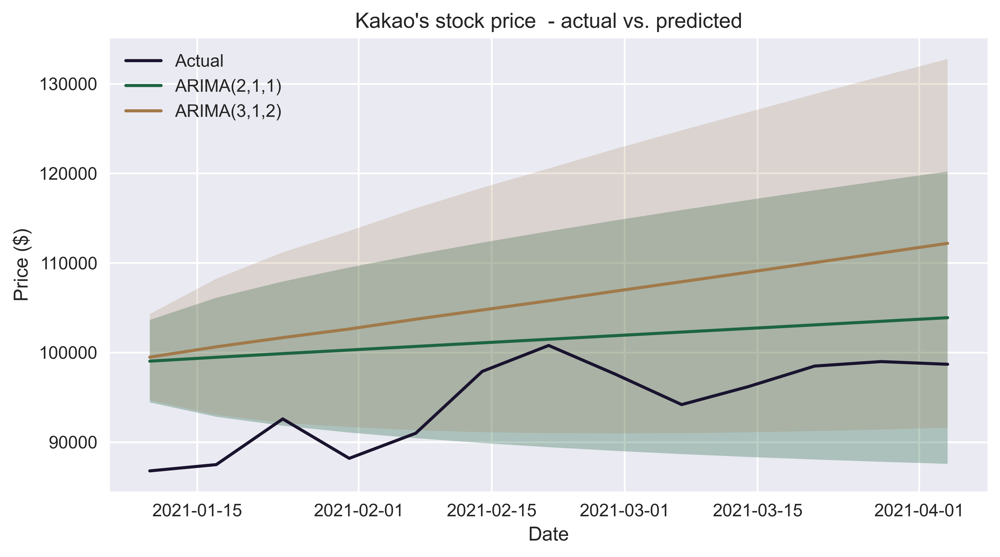

In [23]:
fig, ax = plt.subplots(1)

ax = sns.lineplot(data=test, color=COLORS[0], label='Actual')

ax.plot(arima_pred.prediction, c=COLORS[1], label='ARIMA(2,1,1)')
ax.fill_between(arima_pred.index,
                arima_pred.ci_lower,
                arima_pred.ci_upper,
                alpha=0.3, 
                facecolor=COLORS[1])

ax.plot(auto_arima_pred.prediction, c=COLORS[2], 
        label='ARIMA(3,1,2)')
ax.fill_between(auto_arima_pred.index,
                auto_arima_pred.ci_lower,
                auto_arima_pred.ci_upper,
                alpha=0.2, 
                facecolor=COLORS[2])

ax.set(title="Kakao's stock price  - actual vs. predicted", 
       xlabel='Date', 
       ylabel='Price ($)')
ax.legend(loc='upper left')

plt.tight_layout()

plt.show()